# Run Coemb plots with rev1 embedding

In [12]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

import scanpy as sc

import pybedtools
import sf_utils

sc.set_figure_params(figsize=(3,3))
sc.settings.figdir = "./figures_coemb/"
sc.settings.set_figure_params(dpi_save=100)
sc.settings.set_figure_params(dpi=100)

In [13]:
adata = sc.read_h5ad("./sc_objects/b4_full_coembed_rev1.h5ad")

In [14]:
adata.obs_names.to_frame().to_csv("./b4_full_coembed_rev1_cellnames.csv")

In [20]:
pd.crosstab(adata.obs.day, adata.obs.assay)

assay,ATAC,RNA,clone
day,,,
B4D3,55089,102262,0
B4D12,36259,31629,0
B4D21,122219,82197,0
D0HF1,0,2107,0
D0HF2,0,8419,0
clone,0,0,8050
d0,10119,0,0


In [31]:
adata.obs_names[(adata.obs.assay=='RNA') & (~adata.obs.day.isin(['D0HF1','D0HF2']))].map(lambda x:"r1-" in x).value_counts()

False    123827
True      92261
dtype: int64

In [34]:
adata.obs_names[(adata.obs.assay=='ATAC') & (~adata.obs.day.isin(['d0']))].map(lambda x:"r1-" in x).value_counts()

False    121200
True      92367
dtype: int64

In [36]:
adata.obs[adata.obs.assay!='clone']

,day,assay
d0-ATAC-ATAC-GGGAACAAGTGCTAGG-1,d0,ATAC
d0-ATAC-ATAC-AACCGATAGCAGAAAG-1,d0,ATAC
d0-ATAC-ATAC-CAGGATTGTGTGTGTT-1,d0,ATAC
d0-ATAC-ATAC-CATAACGCAACTCAAC-1,d0,ATAC
d0-ATAC-ATAC-ATGTACGCACGACGAA-1,d0,ATAC
...,...,...
D0HF2-RNA-TTTGTCATCACCGTAA-1,D0HF2,RNA
D0HF2-RNA-TTTGTCATCACTTCAT-1,D0HF2,RNA
D0HF2-RNA-TTTGTCATCCCATTAT-1,D0HF2,RNA
D0HF2-RNA-TTTGTCATCGCTTAGA-1,D0HF2,RNA


In [17]:
# pd.DataFrame(adata.obsm['X_umap'], index=adata.obs_names).to_csv("./b4_full_coembed_rev1_umap.csv")

In [102]:
sc.tl.umap(adata, spread=0.4, min_dist=0.3)
adata.obsm['X_umap'][:,1] = (-1*adata.obsm['X_umap'][:,1]).copy()

In [2]:
adata_rna = sc.read_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")

In [40]:
adata_rna.obs[['frxn_cell.type_cluster_reprogram','frxn_cell.type_cluster_mef','frxn_cell.type_cluster_deadend','Error','Lagrangian']].head()

,frxn_cell.type_cluster_reprogram,frxn_cell.type_cluster_mef,frxn_cell.type_cluster_deadend,Error,Lagrangian
B4D3-RNA-r1-1-AAACCCAAGCCTCTCT-1,0.712903,0.287097,2.196770e-16,5496.667034,4161.592796
B4D3-RNA-r1-1-AAACCCACAAAGTATG-1,0.620972,0.180867,1.981607e-01,6155.638127,4913.457385
B4D3-RNA-r1-1-AAACCCACACTCTAGA-1,0.445801,0.554199,5.199204e-16,10285.201588,9849.447702
B4D3-RNA-r1-1-AAACCCACAGCAGAAC-1,0.401640,0.578700,1.966019e-02,6122.681490,4513.917606
B4D3-RNA-r1-1-AAACCCATCCACGGAC-1,0.485215,0.247866,2.669190e-01,5577.756942,4204.412819


In [41]:
capy_d0 = pd.read_csv("../../rna_analysis/rna_de_seurat/inter_files/hfd0_capy_scores_scale.csv", index_col=0)
capy_d0.index = capy_d0.index.map(lambda x:x.replace("A_","A-"))

In [43]:
adata_rna.obs.loc[capy_d0.index,'frxn_cell.type_cluster_reprogram'] = capy_d0['frxn_cell.type_cluster_reprogram']
adata_rna.obs.loc[capy_d0.index,'frxn_cell.type_cluster_deadend'] = capy_d0['frxn_cell.type_cluster_deadend']
adata_rna.obs.loc[capy_d0.index,'frxn_cell.type_cluster_mef'] = capy_d0['frxn_cell.type_cluster_mef']
adata_rna.obs.loc[capy_d0.index,'Error'] = capy_d0['Error']
adata_rna.obs.loc[capy_d0.index,'Lagrangian'] = capy_d0['Lagrangian']

In [45]:
adata_rna.write_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")

In [19]:
adata_rna = sc.read_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")

In [103]:
adata.obs = adata.obs.merge(adata_rna.obs[['frxn_cell.type_cluster_reprogram','frxn_cell.type_cluster_mef','frxn_cell.type_cluster_deadend','Error','Lagrangian']],
                            right_index=True, left_index=True, how='left')

In [104]:
adata.obs.day.unique()

['d0', 'B4D12', 'B4D21', 'B4D3', 'D0HF1', 'D0HF2', 'clone']
Categories (7, object): ['B4D3', 'B4D12', 'B4D21', 'D0HF1', 'D0HF2', 'clone', 'd0']

In [105]:
day_mapper = {'B4D3':'Day 3','B4D12':'Day 12','B4D21':'Day 21','D0HF1':'MEFs','D0HF2':'MEFs','d0':'MEFs', 'clone':'clone'}
adata.obs.day = adata.obs.day.apply(lambda x:day_mapper[x])

In [108]:
adata.write_h5ad("./sc_objects/b4_full_coembed_rev1.h5ad")

In [3]:
adata = sc.read_h5ad("./sc_objects/b4_full_coembed_rev1.h5ad")

In [4]:
adata_cells = adata[adata.obs.day!='clone'].copy()

In [114]:
adata_cells.uns['day_colors'][0] = '#440154'
adata_cells.uns['day_colors'][1] = '#fde725'
adata_cells.uns['day_colors'][2] = '#35b779'
adata_cells.uns['day_colors'][3] = '#31688e'

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


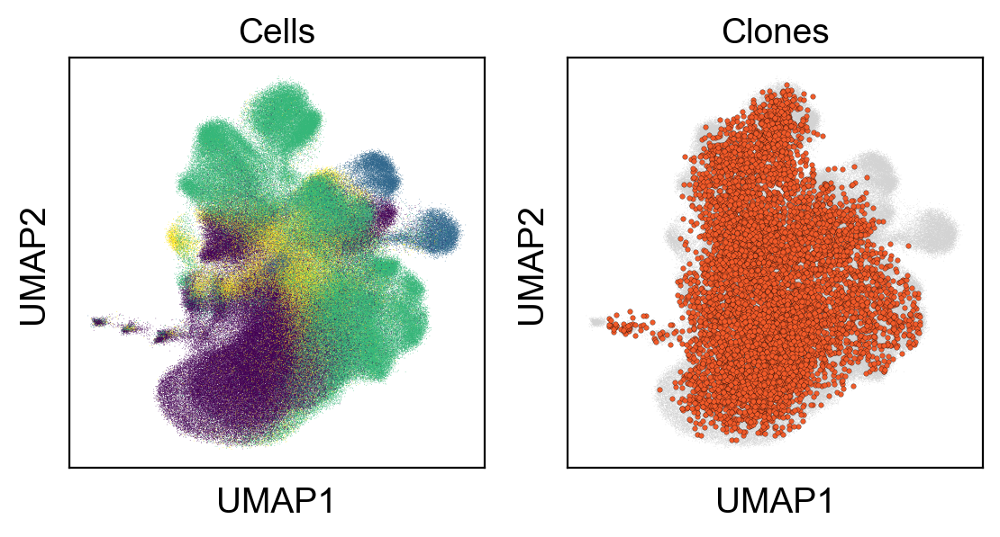

In [115]:
fig = plt.figure(figsize=(6.5,3))
gs = GridSpec(1,2)

ax = plt.subplot(gs[0])
sc.pl.umap(adata_cells, color='day',frameon=True, show=False, ax=ax, title='Cells', legend_loc='')

ax=plt.subplot(gs[1])
sc.pl.umap(adata, ax=ax, show=False, frameon=True)
sns.scatterplot(x=adata.obsm['X_umap'][adata.obs.day=='clone',0],y=adata.obsm['X_umap'][adata.obs.day=='clone',1],
                color='#f15a29', edgecolor='black', s=4, linewidth=0.1)
plt.title('Clones')

plt.savefig("./figures_coemb_rev1/umap_coemb_clones_cells_rev1.pdf", dpi=300)

In [116]:
#add fates
atac_fate = pd.read_csv("../cca/atac_fates.csv", index_col=0)
rna_fate = pd.read_csv("../cca/rna_fates.csv", index_col=0)
all_fates = pd.concat((rna_fate, atac_fate))
all_fates.head()

,fate
B4D12-RNA-r1-1-AAACCCAAGTGGATAT-1,transition
B4D12-RNA-r1-1-AAACCCACAACCTATG-1,reprogramming
B4D12-RNA-r1-1-AAACCCACAAGACAAT-1,reprogramming
B4D12-RNA-r1-1-AAACCCAGTCCACGCA-1,transition
B4D12-RNA-r1-1-AAACCCAGTGCTTATG-1,transition


In [117]:
#16k false - these are the discarded low quality cells
np.unique(all_fates.index.isin(adata_cells.obs_names), return_counts=True)

(array([False,  True]), array([ 16249, 272304]))

In [118]:
adata_cells.obs['annots'] = adata_cells.obs.merge(all_fates, right_index=True, left_index=True,how='left')['fate']

In [120]:
adata_cells.uns['annots_colors'][0] = '#d34529'
adata_cells.uns['annots_colors'][1] = '#473fb2'
adata_cells.uns['annots_colors'][2] = '#4daf4a'

In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


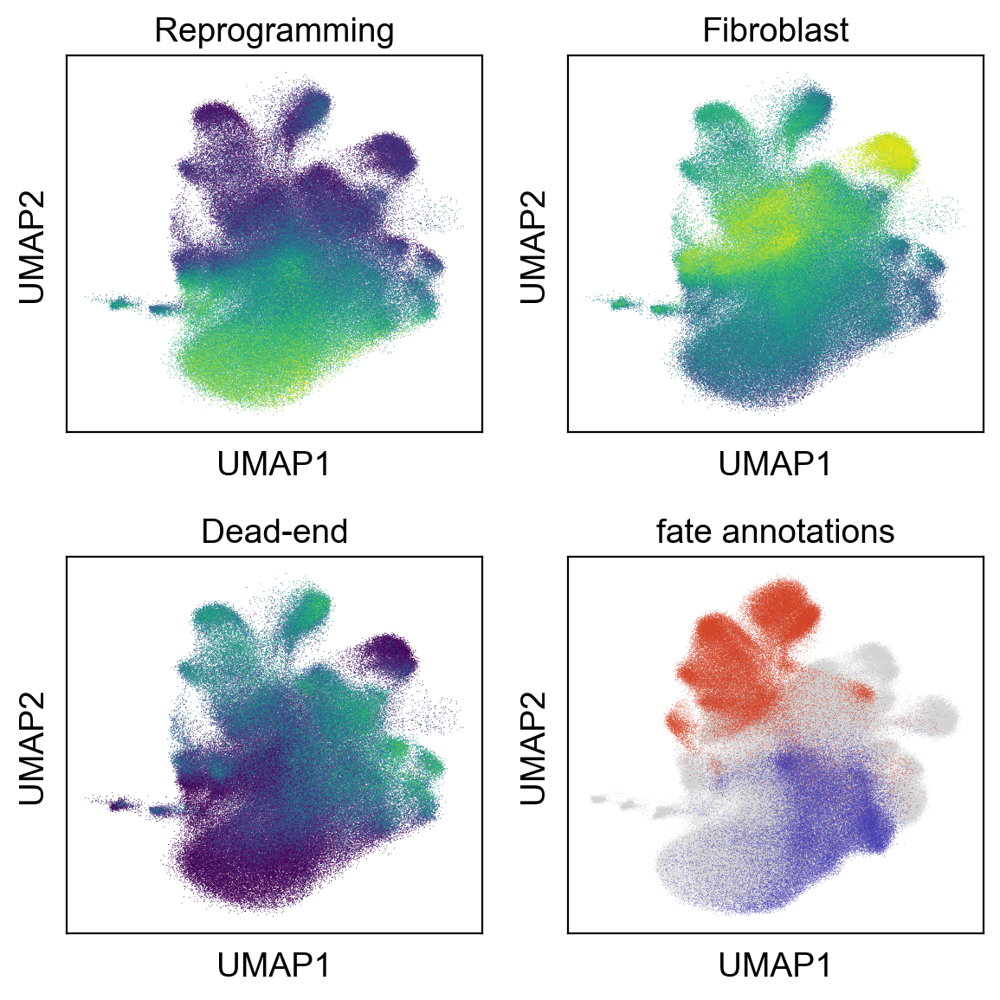

In [121]:
fig = plt.figure(figsize=(6,6))
gs = GridSpec(2,2)

ax = plt.subplot(gs[0])
sc.pl.umap(adata_cells[~adata_cells.obs['frxn_cell.type_cluster_mef'].isnull()],
           color='frxn_cell.type_cluster_reprogram', colorbar_loc=None,
           frameon=True, ax=ax, show=False, title='Reprogramming')

ax = plt.subplot(gs[1])
sc.pl.umap(adata_cells[~adata_cells.obs['frxn_cell.type_cluster_mef'].isnull()],
           color='frxn_cell.type_cluster_mef', colorbar_loc=None,
           frameon=True,ax=ax, show=False, title='Fibroblast')

ax = plt.subplot(gs[2])
sc.pl.umap(adata_cells[~adata_cells.obs['frxn_cell.type_cluster_mef'].isnull()],
           color='frxn_cell.type_cluster_deadend', colorbar_loc=None,
           frameon=True, ax=ax, show=False, title='Dead-end')

ax = plt.subplot(gs[3])
sc.pl.umap(adata_cells, color='annots', title='fate annotations', groups=['reprogramming','dead-end'], ax=ax, show=False, legend_loc=None)

plt.tight_layout()
plt.savefig("./figures_coemb_rev1/umap_coemb_all_rna_qp_rev1.pdf", dpi=300)
# plt.savefig("./figures_coemb/umap_coemb_3fates_only.pdf", dpi=300)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


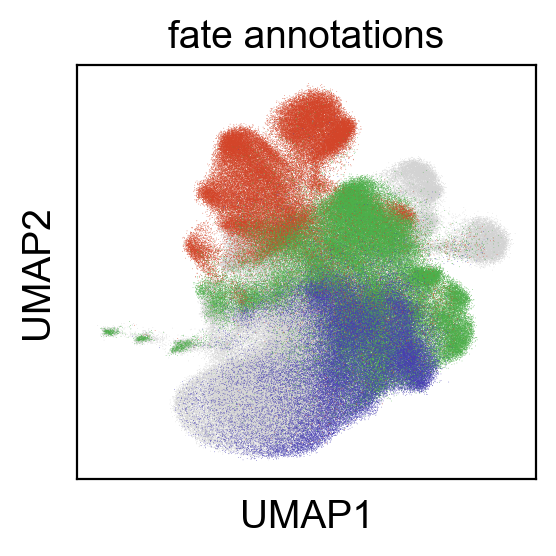

In [122]:
fig = plt.figure(figsize=(3,3))
gs = GridSpec(1,1)

ax = plt.subplot(gs[0])
sc.pl.umap(adata_cells, color='annots', title='fate annotations', ax=ax, show=False, legend_loc=None)

plt.tight_layout()
plt.savefig("./figures_coemb_rev1/umap_coemb_3fates_only_rev1.pdf", dpi=300)

## Save blank UMAP

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


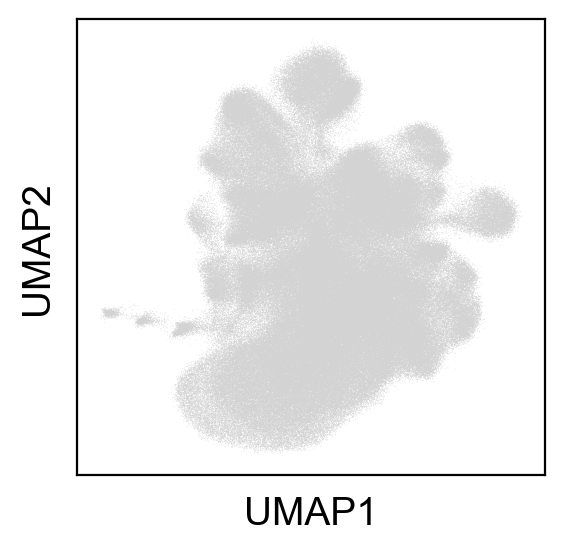

In [123]:
fig = plt.figure(figsize=(3,3))
gs = GridSpec(1,1)

ax = plt.subplot(gs[0])
sc.pl.umap(adata_cells, ax=ax, show=False)

plt.savefig("./figures_coemb_rev1/umap_coemb_blank_rev1.pdf", dpi=300)

## Clonal expansion UMAP

In [4]:
clone_table = pd.read_csv("../../celltag_analysis/mult/proc_files/b4.rna&atac.r1&2_master_rev1_annotated.csv", index_col=0)
clone_table.index = clone_table.clone_id

In [125]:
clone_table_sub = clone_table[['clone.size (RNA & ATAC)','most_dominant_fate_pct','most_dominant_fate']].copy()
clone_table_sub = clone_table_sub[~clone_table_sub.index.duplicated(keep='first')]

In [126]:
adata.obs= adata.obs.merge(clone_table_sub,
                      right_index=True, left_index=True, how='left')

In [135]:
# adata.obs_names.map(lambda x:f'{x.split("-")[1]}-{x.split("-")[2]}' if x[0]!='r' else 'clone')

In [136]:
# adata.obs_names.map(lambda x:x.split("-") if x[0]!='r' else 'clone')

In [137]:
umap_df = pd.DataFrame(np.hstack((adata.obsm['X_umap'],(adata.obs[['clone.size (RNA & ATAC)','most_dominant_fate_pct']].values))),
                       index=adata.obs_names, columns=['x','y','size','fate_pct'])

In [139]:
vals = umap_df[~umap_df['size'].isnull()].copy()
vals.head()

,x,y,size,fate_pct
r1_1,11.431289,-7.596073,443.0,71.655329
r1_10,11.477352,-7.671130,93.0,51.086957
r1_100,11.151754,-6.571486,5.0,60.000000
r1_1000,10.461377,-7.573804,9.0,50.000000
r1_1001,8.268873,-8.927431,2.0,100.000000


In [140]:
leg = np.array([np.percentile(vals['size'].unique()**(1/2), i) for i in [0,25,50,75,100]])

In [141]:
size_vals = (umap_df.sort_values('size')['size'])**(1/2)

In [142]:
#mapper from scaled clone size to dot size
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0.5,100))
scaler.fit(size_vals[~size_vals.isnull()].values.reshape(-1,1))

MinMaxScaler(feature_range=(0.5, 100))

In [143]:
#mapper from scaled clone size to viridis
pal = list(sns.color_palette('viridis', n_colors=len(size_vals[~size_vals.isnull()].sort_values().unique())).as_hex())

In [145]:
pal_mapper = {np.round(i,2):j for i,j in zip(size_vals[~size_vals.isnull()].sort_values().unique(), pal)}

[1.41, 5.48, 7.62, 9.64, 26.21]

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


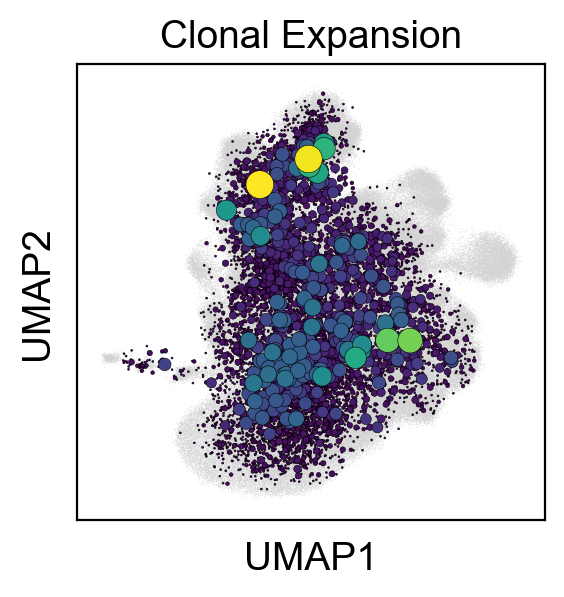

In [150]:
fig = plt.figure(figsize=(3,3))

ax=plt.axes()
sc.pl.umap(adata,ax=ax, show=False, title="Clonal Expansion")
sns.scatterplot(x = 'x', y='y', data=umap_df.sort_values('size'),
               hue = (umap_df.sort_values('size')['size'])**(1/2), palette='viridis', edgecolor='black', linewidth=0.2,
                size=(umap_df.sort_values('size')['size'])**(1/2),sizes=(0.5,100), legend=False)
plt.grid(False)
# plt.legend(leg[-2:],loc='upper right')
plt.savefig("./figures_coemb_rev1/umap_coemb_clonal_expansion_rev1.pdf")

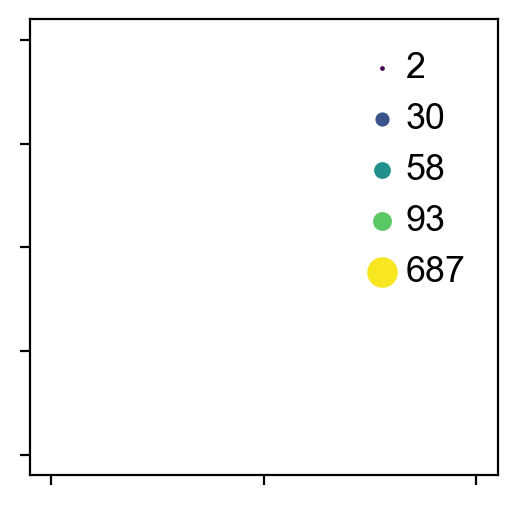

In [159]:
fig = plt.figure(figsize=(3,3))
ax=plt.axes()
for name, size, col in zip(np.round(leg**2),scaler.transform(leg.reshape(-1,1)).flatten(), [np.percentile(list(pal_mapper.keys()),i) for i in [0,25,50,75,100]]):
    plt.scatter([], [], s=size,c=pal_mapper[col],
                label=str(int(name)))

ax.set_yticklabels([])
ax.set_xticklabels([])
plt.legend(scatterpoints=1, frameon=False, labelspacing=0.5)
plt.yticks()
plt.grid(False)
plt.savefig("./figures_coemb_rev1/umap_coemb_clonal_expansion_legend_rev1.pdf")

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


<AxesSubplot: xlabel='UMAP1', ylabel='UMAP2'>

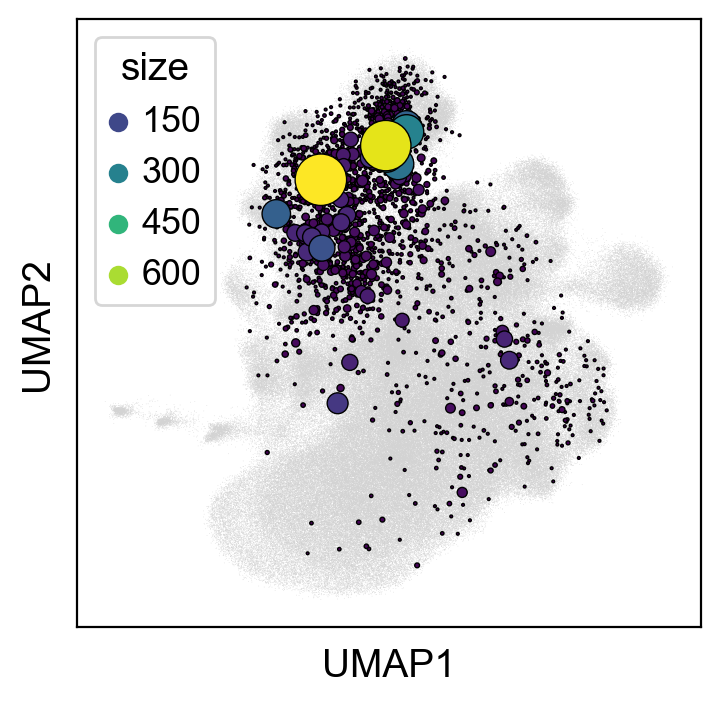

In [160]:
ax=plt.axes()
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'x', y='y', data=umap_df.loc[adata.obs.most_dominant_fate=='dead-end',:].sort_values('size'),
               hue = 'size', palette='viridis', edgecolor='black', linewidth=0.5,
                s=(umap_df.loc[adata.obs.most_dominant_fate=='dead-end',:].sort_values('size')['size'])/2)
# plt.legend([],[], frameon=False)

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


<AxesSubplot: xlabel='UMAP1', ylabel='UMAP2'>

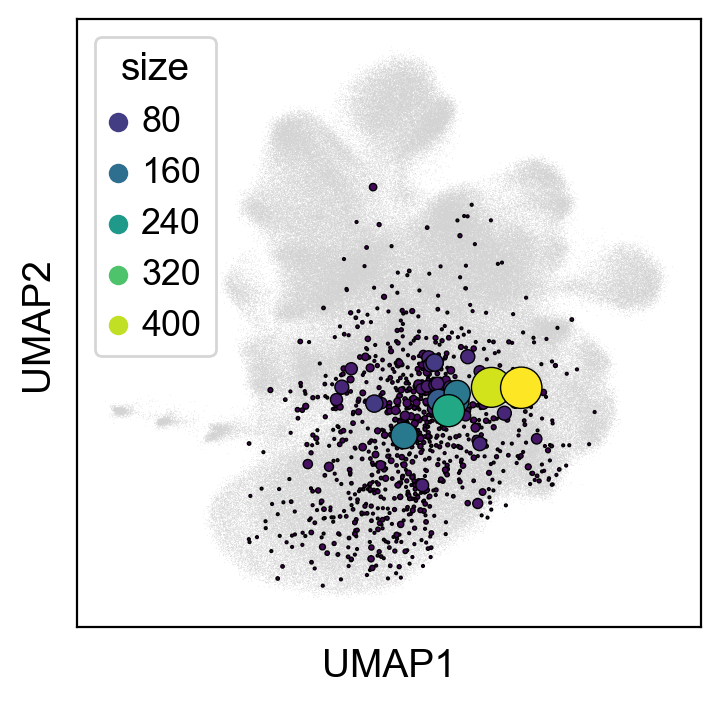

In [161]:
ax=plt.axes()
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'x', y='y', data=umap_df.loc[adata.obs.most_dominant_fate=='reprogramming',:].sort_values('size'),
               hue = 'size', palette='viridis', edgecolor='black', linewidth=0.5,
                s=(umap_df.loc[adata.obs.most_dominant_fate=='reprogramming',:].sort_values('size')['size'])/2)

## Plot RNA and ATAC lineage cells on coemb

In [162]:
rep_cells = pd.read_csv("../../state_fate/clone_grps/most_dominant_rev1//md_rep.csv", index_col=0)
de_cells = pd.read_csv("../../state_fate/clone_grps/most_dominant_rev1//md_de.csv", index_col=0)

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


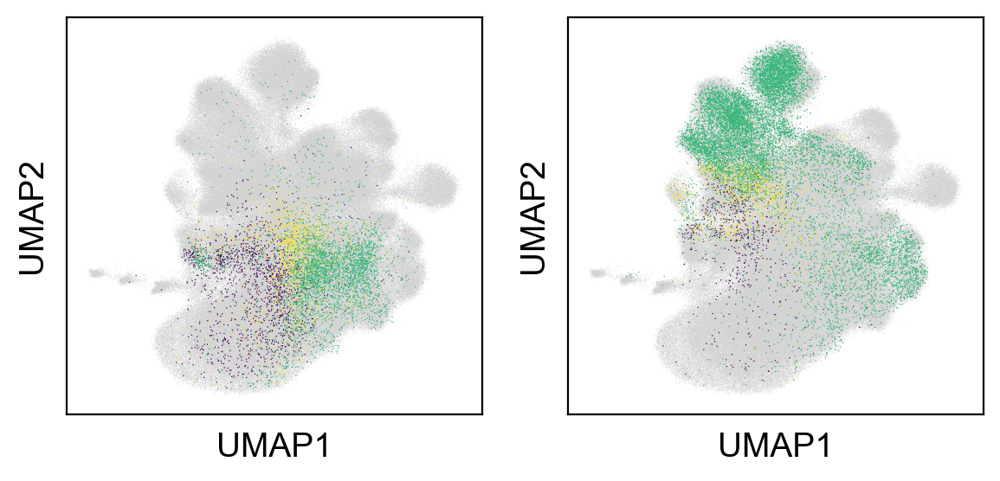

In [164]:
plt.figure(figsize=(6,3))
gs=GridSpec(1,2)

ax=plt.subplot(gs[0])
sc.pl.umap(adata, ax=ax, show=False, frameon=True)
sc.pl.umap(adata[(adata.obs_names.isin(rep_cells['cell.bc']))
                     & (adata.obs['day']=='Day 3')], ax=ax,show=False,na_color='#440154', s=1)

sc.pl.umap(adata[(adata.obs_names.isin(rep_cells['cell.bc']))
                     & (adata.obs['day']=='Day 12')], ax=ax,show=False, na_color='#fde725', s=1)

sc.pl.umap(adata[(adata.obs_names.isin(rep_cells['cell.bc']))
                     & (adata.obs['day']=='Day 21')], ax=ax,show=False, na_color='#35b779', s=1)
    
ax=plt.subplot(gs[1])
sc.pl.umap(adata, ax=ax, show=False, frameon=True)
sc.pl.umap(adata[(adata.obs_names.isin(de_cells['cell.bc']))
                     & (adata.obs['day']=='Day 3')], ax=ax,show=False,na_color='#440154', s=1)

sc.pl.umap(adata[(adata.obs_names.isin(de_cells['cell.bc']))
                     & (adata.obs['day']=='Day 12')], ax=ax,show=False, na_color='#fde725', s=1)

sc.pl.umap(adata[(adata.obs_names.isin(de_cells['cell.bc']))
                     & (adata.obs['day']=='Day 21')], ax=ax,show=False, na_color='#35b779', s=1)

plt.tight_layout()
plt.savefig("./figures_coemb_rev1/two_trajectories_cells_rev1.pdf")

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


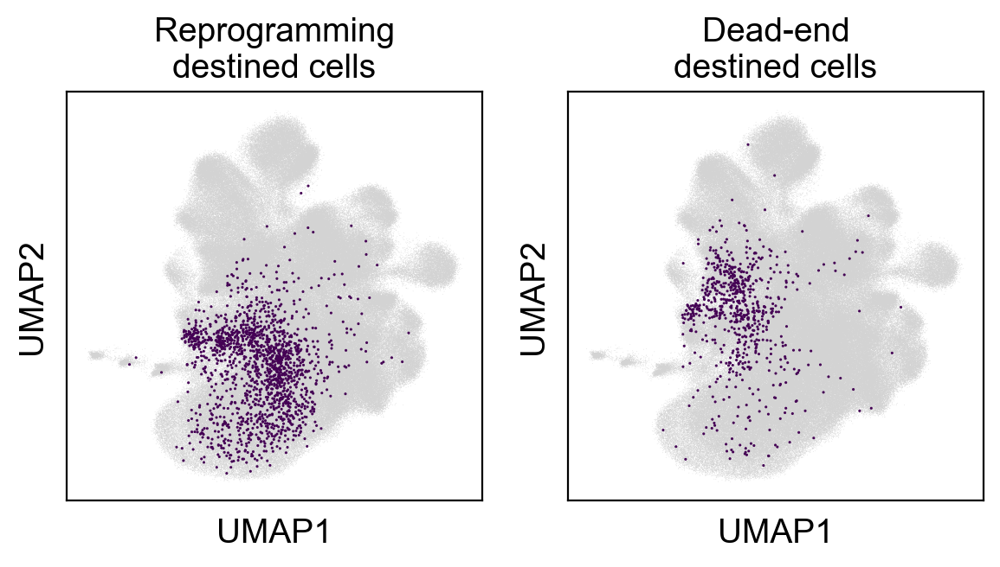

In [168]:
plt.figure(figsize=(6,3.5))
gs=GridSpec(1,2)

ax=plt.subplot(gs[0])
sc.pl.umap(adata, ax=ax, show=False, frameon=True)
sc.pl.umap(adata[(adata.obs_names.isin(rep_cells['cell.bc']))
                     & (adata.obs['day']=='Day 3')], ax=ax,show=False,na_color='#440154', s=5, title='Reprogramming\ndestined cells')

ax=plt.subplot(gs[1])
sc.pl.umap(adata, ax=ax, show=False, frameon=True)
sc.pl.umap(adata[(adata.obs_names.isin(de_cells['cell.bc']))
                     & (adata.obs['day']=='Day 3')], ax=ax,show=False,na_color='#440154', s=5, title='Dead-end\ndestined cells')
plt.tight_layout()
plt.savefig("./figures_coemb_rev1/two_trajectories_state_cells_rev1.pdf")

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


<AxesSubplot: xlabel='UMAP1', ylabel='UMAP2'>

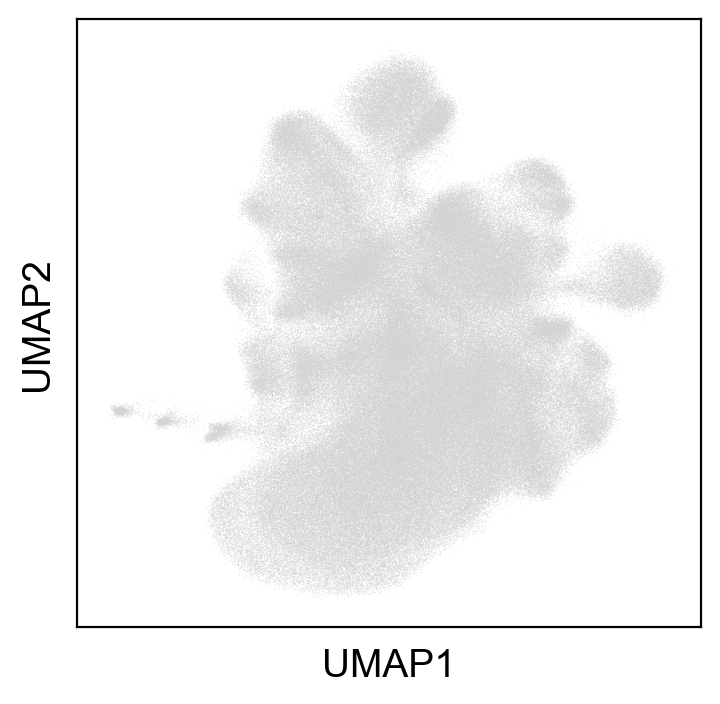

In [169]:
#get lims for next plots
ax=plt.axes()
sc.pl.umap(adata, show=False, ax=ax)

In [170]:
y_lims = ax.get_ylim()
x_lims = ax.get_xlim()

In [171]:
day_mapper = {'D3':'Day 3', 'D12':'Day 12','D21':'Day 21'}

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


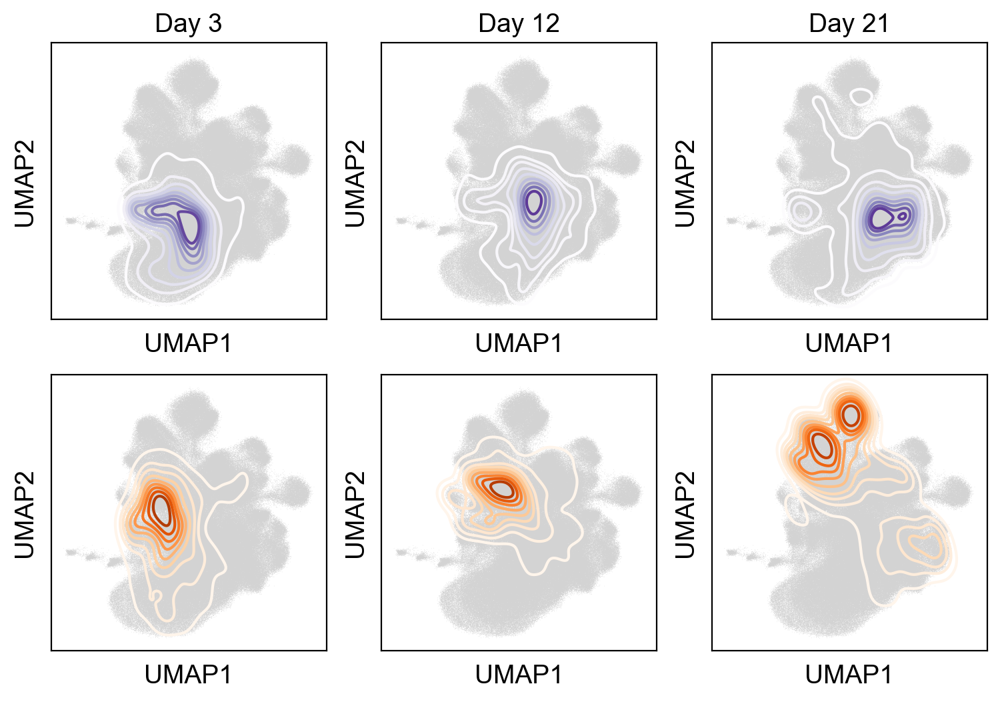

In [172]:
plt.figure(figsize=(9,6))
gs = GridSpec(2,3)


for i,j in zip(range(4),['D3','D12','D21']):
    
#     if(j=='all'):
#         rep_coords = adata[adata.obs_names.isin(rep_cells['cell.bc'])].obsm['X_umap']
#         de_coords = adata[adata.obs_names.isin(de_cells['cell.bc'])].obsm['X_umap']   
        
#         ax=plt.subplot(gs[i])
#         sc.pl.umap(adata, ax=ax, show=False, frameon=True)
#         sns.kdeplot(x=rep_coords[:,0], y=rep_coords[:,1],ax=ax, cmap='Blues')
#         plt.title('All Days')

#         ax=plt.subplot(gs[i+4])
#         sc.pl.umap(adata, ax=ax, show=False, frameon=True)
#         sns.kdeplot(x=de_coords[:,0], y=de_coords[:,1],ax=ax, cmap='Reds')
    
    rep_coords = adata[adata.obs_names.isin(rep_cells[rep_cells.day==j]['cell.bc'])].obsm['X_umap']
    de_coords = adata[adata.obs_names.isin(de_cells[de_cells.day==j]['cell.bc'])].obsm['X_umap']

    ax=plt.subplot(gs[i])
    sc.pl.umap(adata, ax=ax, show=False, frameon=True)
    sns.kdeplot(x=rep_coords[:,0], y=rep_coords[:,1],ax=ax, cmap='Purples')
    plt.title(day_mapper[j])
    plt.setp(ax, xlim=x_lims, ylim=y_lims)

    ax=plt.subplot(gs[i+3])
    sc.pl.umap(adata, ax=ax, show=False, frameon=True)
    sns.kdeplot(x=de_coords[:,0], y=de_coords[:,1],ax=ax, cmap='Oranges')
    plt.setp(ax, xlim=x_lims, ylim=y_lims)

plt.savefig("./figures_coemb_rev1/lineage_contours_coemb_rev1.pdf")

## Clone nodes represent cells

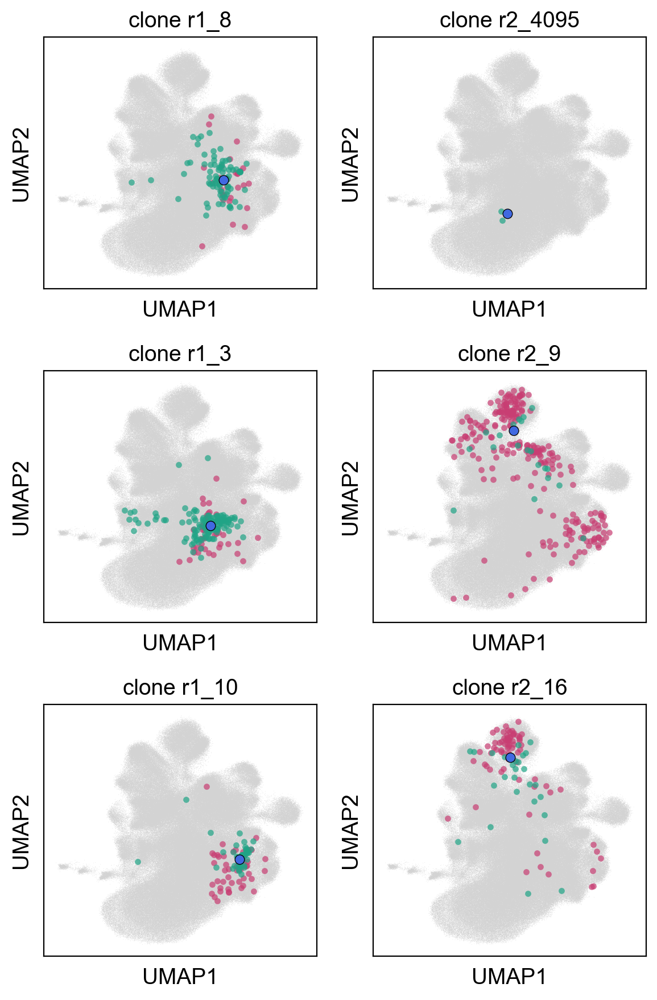

In [5]:
# clones_to_plot = np.random.choice(clone_table['clone_id'].value_counts().head(50).index,6)
clones_to_plot = ['r1_8','r2_4095','r1_3','r2_9','r1_10','r2_16']
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(6,9))
gs = GridSpec(3,2)

for i,j in zip(gs, clones_to_plot):
    
    #get clone ATAC cells
    cells_atac = clone_table[(clone_table['clone_id'] == j) & (clone_table['assay']=='ATAC')]['cell.bc']
    cells_rna = clone_table[(clone_table['clone_id'] == j) & (clone_table['assay']=='RNA')]['cell.bc']
    
    ax=plt.subplot(i)
    #plot whole map
    sc.pl.umap(adata, ax=ax, show=False, frameon=True)
    
    #plot cells
    sns.scatterplot(x=adata.obsm['X_umap'][adata.obs_names.isin(cells_atac),0],
                   y=adata.obsm['X_umap'][adata.obs_names.isin(cells_atac),1],
                    color='#c83e73', s=15, alpha=0.7,linewidth=0)
    
    sns.scatterplot(x=adata.obsm['X_umap'][adata.obs_names.isin(cells_rna),0],
                   y=adata.obsm['X_umap'][adata.obs_names.isin(cells_rna),1],
                    color='#20a486', s=15, alpha=0.7, linewidth=0)
    
    #plot clone node
    sns.scatterplot(x=adata.obsm['X_umap'][adata.obs_names.isin([j]),0],
                   y=adata.obsm['X_umap'][adata.obs_names.isin([j]),1],
                    color='royalblue', edgecolor='black')
    
    plt.title(f'clone {j}')

plt.tight_layout()
# plt.savefig("../proc_files/plots/clones_represent_cells_umap.pdf")  #[ 120 1317 3052 2757 2601]
plt.savefig("./figures_coemb_rev1/clones_represent_cells_umap_rev1.pdf")  #'r2_9', 'r1_8', 'r1_10', 'r2_4095', 'r2_16', 'r1_3'

## Plot marker expression on Coemb

In [6]:
adata_rna = adata_rna[adata_rna.obs_names.isin(adata_cells.obs_names)].copy()

In [7]:
umap_df = pd.DataFrame(adata.obsm['X_umap'],index=adata.obs_names, columns=['x','y'])

In [8]:
adata_rna.obsm['X_og_umap'] = adata_rna.obsm['X_umap'].copy()

In [9]:
adata_rna.obsm['X_umap'] = umap_df.reindex(adata_rna.obs_names).values

In [10]:
adata_rna.write_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")

In [3]:
adata_rna = sc.read_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")

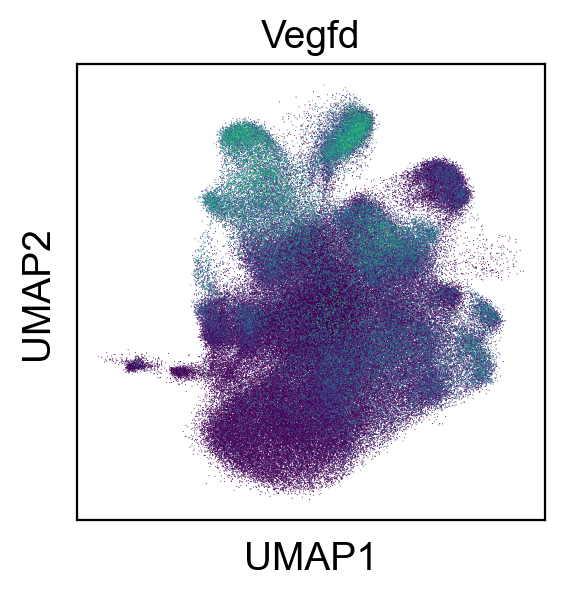

In [4]:
fig=plt.figure(figsize=(3,3))
ax=plt.axes()
sc.pl.umap(adata_rna, color='Vegfd', colorbar_loc=None, ax=ax, show=False)
plt.savefig("./figures_coemb_rev1/umap_coemb_vegfd_gex_rev1.pdf", dpi=300)

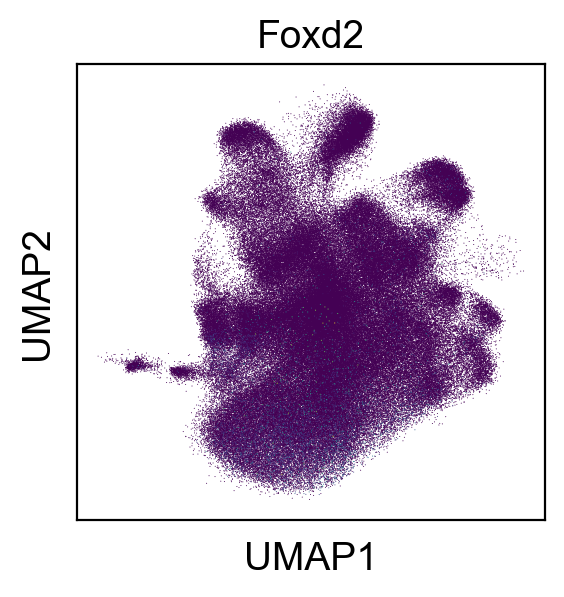

In [11]:
fig=plt.figure(figsize=(3,3))
ax=plt.axes()
sc.pl.umap(adata_rna, color='Foxd2', colorbar_loc=None, ax=ax, show=False)
plt.savefig("./figures_coemb_rev1/umap_coemb_foxd2_gex_rev1.pdf", dpi=300)

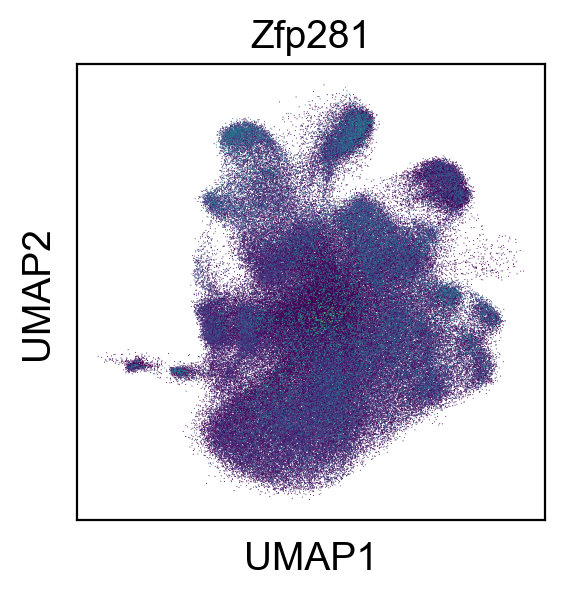

In [12]:
fig=plt.figure(figsize=(3,3))
ax=plt.axes()
sc.pl.umap(adata_rna, color='Zfp281', colorbar_loc=None, ax=ax, show=False)
plt.savefig("./figures_coemb_rev1/umap_coemb_zfp281_gex_rev1.pdf", dpi=300)

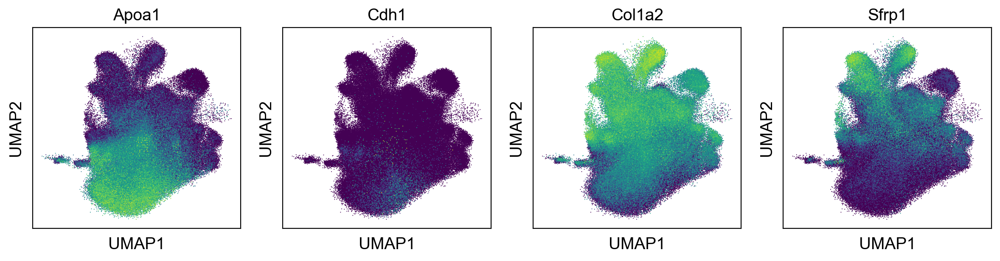

In [13]:
genes_to_plot = ['Apoa1','Cdh1','Col1a2','Sfrp1']


fig = plt.figure(figsize=(12,3.3))
gs = GridSpec(1,4)

for i,j in zip(gs, genes_to_plot):
    ax=plt.subplot(i)
    # ax.set(facecolor = "none")
    # sc.pl.umap(adata, s=2, ax=ax, show=False,facecolor = "none")
    sc.pl.umap(adata_rna,color=j, colorbar_loc=None, ax=ax, show=False, s=2,facecolor = "none")

plt.tight_layout()
plt.savefig("./figures_coemb_rev1/umap_coemb_marker_gex_rev1.pdf",dpi=300)

In [14]:
# genes_to_plot = ['Apoa1','Cdh1','Col1a2','Sfrp1']


# fig = plt.figure(figsize=(12,3.3))
# gs = GridSpec(1,4)

# for i,j in zip(gs, genes_to_plot):
#     ax=plt.subplot(i)
#     sc.pl.umap(adata_rna, s=2, ax=ax, show=False, title=j)
    
# plt.tight_layout()
# plt.savefig("./figures_coemb_rev1/umap_coemb_marker_gex_blank_rev1.pdf",dpi=300)

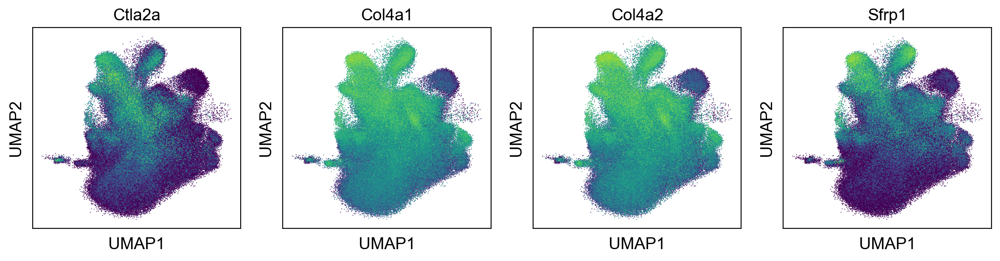

In [3]:
genes_to_plot = ['Ctla2a','Col4a1','Col4a2','Sfrp1']


fig = plt.figure(figsize=(12,3.3))
gs = GridSpec(1,4)

for i,j in zip(gs, genes_to_plot):
    ax=plt.subplot(i)
    sc.pl.umap(adata_rna,color=j, colorbar_loc=None, ax=ax, show=False, s=2)

plt.tight_layout()
plt.savefig("./figures_coemb_rev1/umap_coemb_marker_deadend_rev1.pdf",dpi=300)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


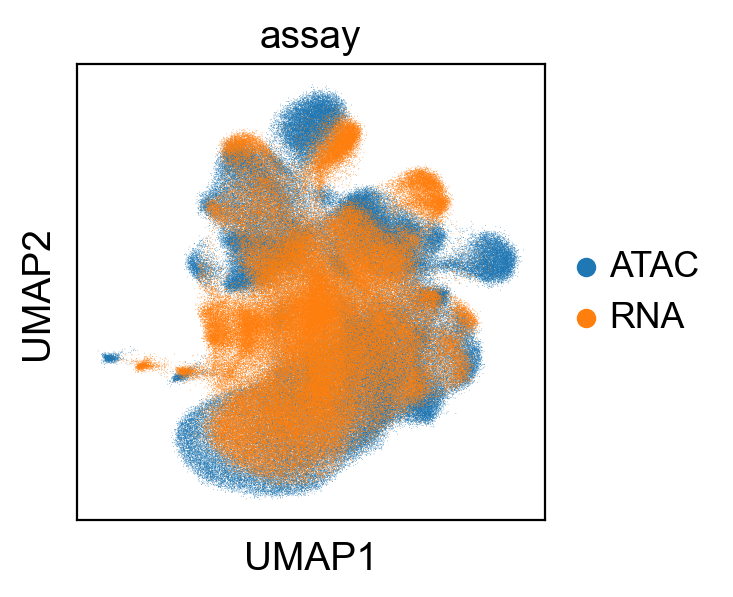

In [17]:
fig = plt.figure(figsize=(3,3))

ax=plt.axes()
sc.pl.umap(adata_cells, show=False, ax=ax, color='assay')
plt.savefig("./figures_coemb_rev1/umap_coemb_assay_rev1.pdf")

## Plot top 20 clones for each lineage

In [1]:
clone_table = pd.read_csv("../../celltag_analysis/mult/proc_files/b4.rna&atac.r1&2_master_rev1_annotated.csv", index_col=0)
clone_table.drop_duplicates("clone_id", inplace=True)

NameError: name 'pd' is not defined

In [5]:
top_de_clones = clone_table[clone_table['most_dominant_fate']=='dead-end'].sort_values('clone.size (RNA & ATAC)', ascending=False).head(20)['clone_id'].values
top_rep_clones = clone_table[clone_table['most_dominant_fate']=='reprogramming'].sort_values('clone.size (RNA & ATAC)', ascending=False).head(20)['clone_id'].values

In [6]:
my_pal = ["#D51F26", "#272E6A" ,"#208A42" ,"#89288F", "#F47D2B", "#FEE500", "#8A9FD1" ,"#C06CAB",
          "#E6C2DC" ,"#90D5E4", "#89C75F", "#F37B7D", "#9983BD" ,"#D24B27", "#3BBCA8" ,
          "#6E4B9E", "#0C727C" ,"#7E1416", "#D8A767", "#3D3D3D"]
my_pal.reverse()

# de_clones = ["r2_6"  ,  "r2_11"   ,"r1_4"  ,  "r2_2297", "r2_24" ,  "r2_27" ,  "r1_12" ,  
#              "r1_13"  , "r2_2263", "r1_677",  "r2_35" ,  "r2_2296" ,"r2_2356", "r2_54",   "r2_2229",
#              "r2_57" ,  "r1_572",  "r1_744" , "r1_665" , "r2_2583"]

# rep_clones = ["r1_1" ,   "r1_2"  ,  "r1_3"   , "r1_5"   , "r1_7",    "r1_10" ,  "r1_608" , "r1_564" ,
#               "r1_669" , "r1_566" , "r1_20",   "r1_21" ,  "r2_48"  , "r1_578" , "r2_2674",
#               "r1_646" , "r1_662" , "r1_702" , "r2_63"  , "r2_2271"]

In [9]:
de_umap = pd.DataFrame(adata[top_de_clones].obsm['X_umap'], index = adata[top_de_clones].obs_names, columns=['umap1','umap2'])
rep_umap = pd.DataFrame(adata[top_rep_clones].obsm['X_umap'], index = adata[top_rep_clones].obs_names, columns=['umap1','umap2'])

In [10]:
clone_table.index = clone_table.clone_id

In [11]:
de_umap['size'] = clone_table.loc[de_umap.index]['clone.size (RNA & ATAC)']
rep_umap['size'] = clone_table.loc[rep_umap.index]['clone.size (RNA & ATAC)']

In [12]:
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb


No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


Text(0.5, 1.0, 'rep')

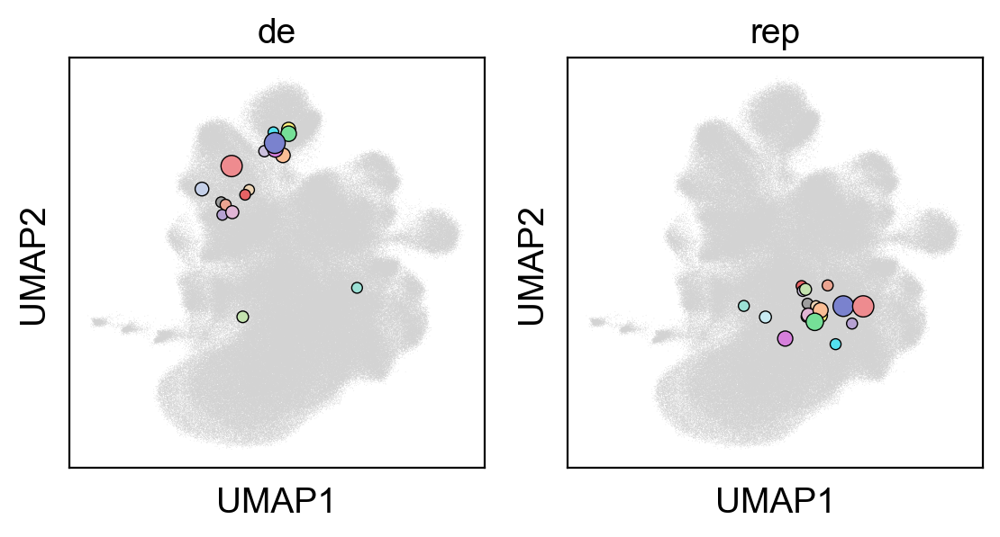

In [14]:
fig=plt.figure(figsize=(6.5,3))
gs=GridSpec(1,2)

ax=plt.subplot(gs[0])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=de_umap.sort_values('size'),
                c = sns.color_palette([lighten_color(i) for i in my_pal], as_cmap=True),
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
plt.title("de")

ax=plt.subplot(gs[1])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=rep_umap.sort_values('size'),
                c = sns.color_palette([lighten_color(i) for i in my_pal], as_cmap=True),
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
plt.title("rep")
# plt.tight_layout()
plt.savefig("figures_coemb_rev1/top20_clones_coemb_rev1.pdf", dpi=300)

## Plot top 20 clones for each lineage (size and mki67 expr), save data for alluvial plots

In [5]:
clone_table = pd.read_csv("../../celltag_analysis/mult/proc_files/b4.rna&atac.r1&2_master_rev1_annotated.csv")
clone_table['replicate'] = clone_table['clone_id'].apply(lambda x:x.split("_")[0])

In [6]:
clone_table2 = clone_table[(clone_table['# of D3 cells (RNA & ATAC)'] > 0) &
            (clone_table['# of D12 cells (RNA & ATAC)'] > 0) &
            (clone_table['# of D21 cells (RNA & ATAC)'] > 0)].copy()

In [7]:
clone_counts = clone_table2.groupby(['day','clone_id'], as_index=False)[['cell.bc']].count()
clone_counts = pd.pivot_table(clone_counts, columns = 'day', index='clone_id')

In [8]:
clone_counts = clone_counts/clone_counts.sum()

In [9]:
clone_counts = clone_counts.stack().reset_index()
clone_counts.head()

,clone_id,day,cell.bc
0,r1_1,D12,0.035990
1,r1_1,D21,0.071947
2,r1_1,D3,0.001577
3,r1_10,D12,0.002571
4,r1_10,D21,0.017332


In [10]:
clone_counts = clone_counts.merge(clone_table2.drop_duplicates('clone_id')[['most_dominant_fate','clone.size (RNA & ATAC)','clone_id']], right_on='clone_id',
                   left_on='clone_id').copy()

In [11]:
rep_clones = clone_counts[clone_counts.most_dominant_fate=='reprogramming'].sort_values('clone.size (RNA & ATAC)',
                                                                                        ascending=False).drop_duplicates('clone_id')['clone_id'][:20]

de_clones = clone_counts[clone_counts.most_dominant_fate=='dead-end'].sort_values('clone.size (RNA & ATAC)',
                                                                                        ascending=False).drop_duplicates('clone_id')['clone_id'][:20]

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.


In [12]:
de_clones

1278       r2_6
754       r2_12
257        r1_4
853     r2_1885
992       r2_21
148       r1_12
201       r1_13
1160      r2_24
864     r2_1893
818     r2_1850
440      r1_677
914     r2_1949
299      r1_572
521      r1_744
1244      r2_44
419      r1_665
953     r2_2015
1277      r2_56
374      r1_629
887     r2_1916
Name: clone_id, dtype: object

In [13]:
clone_counts.index = clone_counts.clone_id

In [14]:
clone_counts.loc[rep_clones.values].to_csv("misc_plotdata_rev1/clone_expansion_rep20_alluvial.csv")
clone_counts.loc[de_clones.values].to_csv("misc_plotdata_rev1/clone_expansion_de20_alluvial.csv")

In [15]:
clone_table = pd.read_csv("../../celltag_analysis/mult/proc_files/b4.rna&atac.r1&2_master_rev1_annotated.csv", index_col=0)
clone_table.drop_duplicates("clone_id", inplace=True)

In [16]:
my_pal = ["#D51F26", "#272E6A" ,"#208A42" ,"#89288F", "#F47D2B", "#FEE500", "#8A9FD1" ,"#C06CAB",
          "#E6C2DC" ,"#90D5E4", "#89C75F", "#F37B7D", "#9983BD" ,"#D24B27", "#3BBCA8" ,
          "#6E4B9E", "#0C727C" ,"#7E1416", "#D8A767", "#3D3D3D"]
my_pal.reverse()

In [17]:
de_clones.values

array(['r2_6', 'r2_12', 'r1_4', 'r2_1885', 'r2_21', 'r1_12', 'r1_13',
       'r2_24', 'r2_1893', 'r2_1850', 'r1_677', 'r2_1949', 'r1_572',
       'r1_744', 'r2_44', 'r1_665', 'r2_2015', 'r2_56', 'r1_629',
       'r2_1916'], dtype=object)

In [18]:
de_umap = pd.DataFrame(adata[de_clones.values].obsm['X_umap'], index = adata[de_clones.values].obs_names, columns=['umap1','umap2'])
rep_umap = pd.DataFrame(adata[rep_clones.values].obsm['X_umap'], index = adata[rep_clones.values].obs_names, columns=['umap1','umap2'])

In [19]:
clone_table.index = clone_table.clone_id

In [20]:
de_umap['size'] = clone_table.loc[de_umap.index]['clone.size (RNA & ATAC)']
rep_umap['size'] = clone_table.loc[rep_umap.index]['clone.size (RNA & ATAC)']

In [21]:
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb


No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


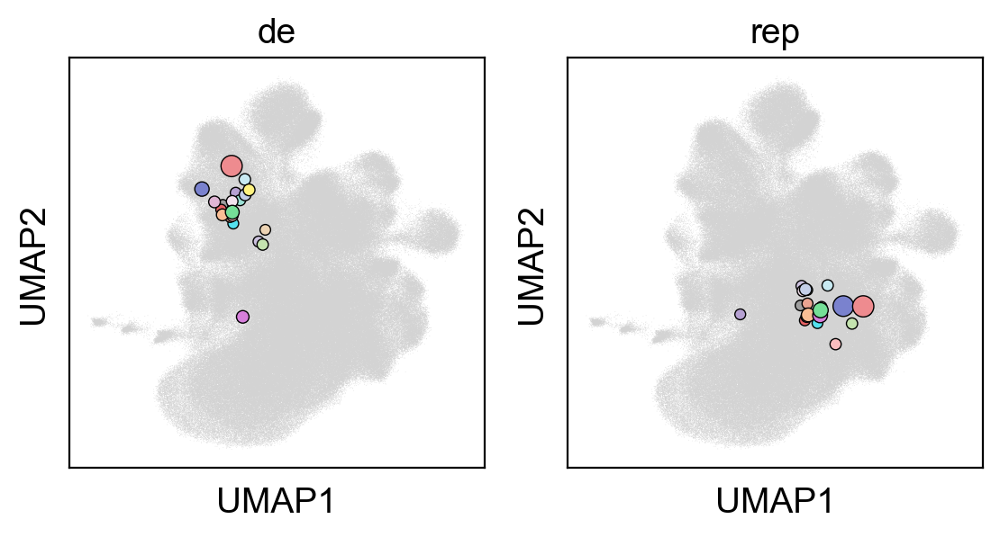

In [23]:
fig=plt.figure(figsize=(6.5,3))
gs=GridSpec(1,2)

ax=plt.subplot(gs[0])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=de_umap.sort_values('size'),
                c = sns.color_palette([lighten_color(i) for i in my_pal], as_cmap=True),
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
plt.title("de")

ax=plt.subplot(gs[1])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=rep_umap.sort_values('size'),
                c = sns.color_palette([lighten_color(i) for i in my_pal], as_cmap=True),
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
plt.title("rep")
# plt.tight_layout()
plt.savefig("figures_coemb_rev1/top20_clones_coemb_rev1.pdf", dpi=300)

### plot Ki67 expression levels

In [69]:
clone_table = pd.read_csv("../../celltag_analysis/mult/proc_files/b4.rna&atac.r1&2_master_rev1_annotated.csv")
clone_table.index = clone_table.clone_id
clone_table = clone_table[clone_table['assay']=='RNA'].copy()

In [70]:
clone_table_sub = clone_table.loc[pd.concat((de_umap,rep_umap)).index][['cell.bc', 'clone_id']]

In [71]:
clone_cell_mtx = sf_utils.table_to_spmtx(row_data=clone_table_sub['clone_id'],
                        col_data=clone_table_sub['cell.bc'],
                        count_data=np.array([1]*len(clone_table_sub)))

In [77]:
#Not used eventually
# sc.tl.score_genes(adata_rna, gene_list=['Mki67','Top2a','Pcna','Mcm3','Cdk1'], score_name='proliferation_sig', use_raw=False)

In [74]:
clone_gex = np.matmul(clone_cell_mtx[0].todense(),adata_rna[clone_cell_mtx[2]].X)
clone_gex = pd.DataFrame(clone_gex, index=clone_cell_mtx[1], columns=adata_rna.var_names)


# clone_gex = np.matmul(clone_cell_mtx[0].todense(),np.expand_dims(adata_rna[clone_cell_mtx[2]].obs['proliferation_sig'].values, axis=1))
# clone_gex = pd.DataFrame(clone_gex, index=clone_cell_mtx[1], columns=['proliferation_sig'])

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


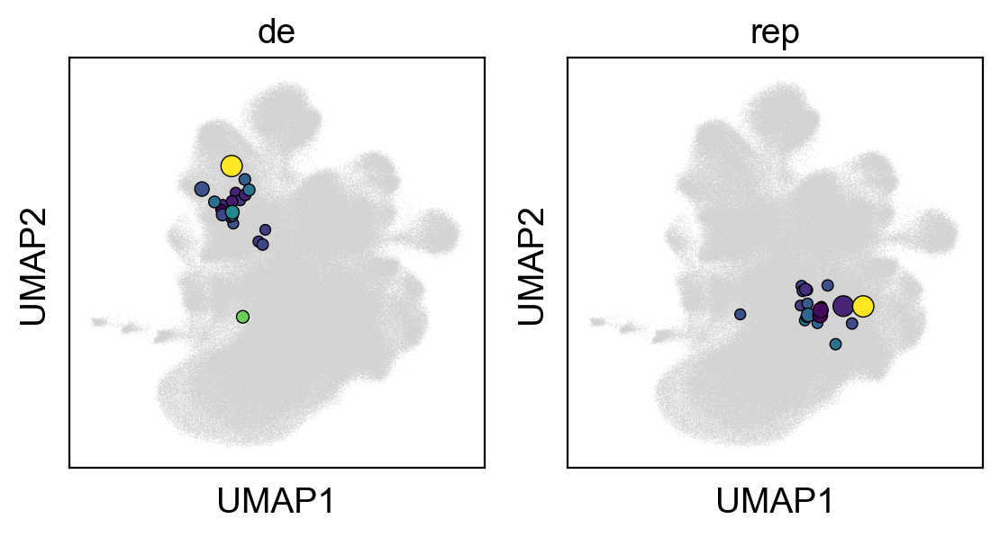

In [78]:
fig=plt.figure(figsize=(6.5,3))
gs=GridSpec(1,2)

ax=plt.subplot(gs[0])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=de_umap.sort_values('size'), palette='viridis',
                hue = clone_gex.loc[de_umap.sort_values('size').index,'Mki67'],
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
# plt.colorbar()
plt.title("de")

ax=plt.subplot(gs[1])
sc.pl.umap(adata,ax=ax, show=False)
sns.scatterplot(x = 'umap1', y='umap2', data=rep_umap.sort_values('size'), palette='viridis',
                hue = clone_gex.loc[rep_umap.sort_values('size').index,'Mki67'],
                edgecolor='black', linewidth=0.5,size='size', ax=ax, legend=False)
plt.title("rep")
plt.savefig("figures_coemb_rev1/top20_clones_coemb_proliferation_Mki67_rev1.pdf", dpi=300)

In [40]:
# adata_rna.write_h5ad("../../rna_analysis/anndata_objs/all_rna_new_rev1.h5ad")